In [1]:
import pandas as pd
import numpy as np
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, confusion_matrix, roc_auc_score, roc_curve
from pandas_profiling import ProfileReport

In [5]:
df = pd.read_csv('winequality-red.csv', sep = ';')

In [6]:
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [7]:
df['quality']

0       5
1       5
2       5
3       6
4       5
       ..
1594    5
1595    6
1596    6
1597    5
1598    6
Name: quality, Length: 1599, dtype: int64

In [8]:
set(df['quality'])

{3, 4, 5, 6, 7, 8}

In [9]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/25 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [10]:
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [11]:
x = df.drop(columns='quality')
x

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2


In [12]:
y = df['quality']

In [13]:
y

0       5
1       5
2       5
3       6
4       5
       ..
1594    5
1595    6
1596    6
1597    5
1598    6
Name: quality, Length: 1599, dtype: int64

In [17]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = .25, random_state = 30)

In [18]:
x_train

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
1178,5.6,0.915,0.00,2.1,0.041,17.0,78.0,0.99346,3.68,0.73,11.4
1189,8.8,0.955,0.05,1.8,0.075,5.0,19.0,0.99616,3.30,0.44,9.6
161,7.6,0.680,0.02,1.3,0.072,9.0,20.0,0.99650,3.17,1.08,9.2
109,8.1,0.785,0.52,2.0,0.122,37.0,153.0,0.99690,3.21,0.69,9.3
961,7.1,0.560,0.14,1.6,0.078,7.0,18.0,0.99592,3.27,0.62,9.3
...,...,...,...,...,...,...,...,...,...,...,...
919,8.4,0.620,0.12,1.8,0.072,38.0,46.0,0.99504,3.38,0.89,11.8
1164,9.0,0.785,0.24,1.7,0.078,10.0,21.0,0.99692,3.29,0.67,10.0
500,7.8,0.520,0.25,1.9,0.081,14.0,38.0,0.99840,3.43,0.65,9.0
941,9.9,0.270,0.49,5.0,0.082,9.0,17.0,0.99484,3.19,0.52,12.5


In [19]:
x_test

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
1147,10.0,0.410,0.45,6.20,0.071,6.0,14.0,0.99702,3.21,0.49,11.8
659,7.1,0.840,0.02,4.40,0.096,5.0,13.0,0.99700,3.41,0.57,11.0
871,6.9,0.560,0.03,1.50,0.086,36.0,46.0,0.99522,3.53,0.57,10.6
1333,9.1,0.775,0.22,2.20,0.079,12.0,48.0,0.99760,3.18,0.51,9.6
1411,6.4,0.470,0.40,2.40,0.071,8.0,19.0,0.99630,3.56,0.73,10.6
...,...,...,...,...,...,...,...,...,...,...,...
721,8.9,0.480,0.24,2.85,0.094,35.0,106.0,0.99820,3.10,0.53,9.2
490,9.3,0.775,0.27,2.80,0.078,24.0,56.0,0.99840,3.31,0.67,10.6
575,12.3,0.270,0.49,3.10,0.079,28.0,46.0,0.99930,3.20,0.80,10.2
1051,8.5,0.460,0.59,1.40,0.414,16.0,45.0,0.99702,3.03,1.34,9.2


In [20]:
dt_model = DecisionTreeClassifier()

In [21]:
dt_model

DecisionTreeClassifier()

In [22]:
dt_model.fit(x_train, y_train)

DecisionTreeClassifier()

In [23]:
import sklearn
import matplotlib.pyplot as plt
%matplotlib inline

[Text(616.8669353761487, 1057.0, 'X[10] <= 10.35\ngini = 0.642\nsamples = 1199\nvalue = [8, 35, 512, 477, 153, 14]'),
 Text(365.8986762662962, 996.6, 'X[6] <= 95.5\ngini = 0.528\nsamples = 666\nvalue = [6, 20, 406, 209, 23, 2]'),
 Text(230.20555941440477, 936.2, 'X[9] <= 0.585\ngini = 0.554\nsamples = 584\nvalue = [6, 19, 332, 202, 23, 2]'),
 Text(85.87195447745245, 875.8, 'X[6] <= 90.5\ngini = 0.468\nsamples = 261\nvalue = [3, 14, 179, 63, 2, 0]'),
 Text(59.79210301346441, 815.4000000000001, 'X[10] <= 9.075\ngini = 0.453\nsamples = 250\nvalue = [3, 14, 176, 55, 2, 0]'),
 Text(19.08100021372088, 755.0, 'X[6] <= 39.0\ngini = 0.604\nsamples = 15\nvalue = [0, 2, 6, 7, 0, 0]'),
 Text(7.632400085488352, 694.6, 'X[8] <= 3.38\ngini = 0.406\nsamples = 8\nvalue = [0, 1, 1, 6, 0, 0]'),
 Text(3.816200042744176, 634.2, 'gini = 0.0\nsamples = 6\nvalue = [0, 0, 0, 6, 0, 0]'),
 Text(11.448600128232528, 634.2, 'X[6] <= 23.5\ngini = 0.5\nsamples = 2\nvalue = [0, 1, 1, 0, 0, 0]'),
 Text(7.63240008548835

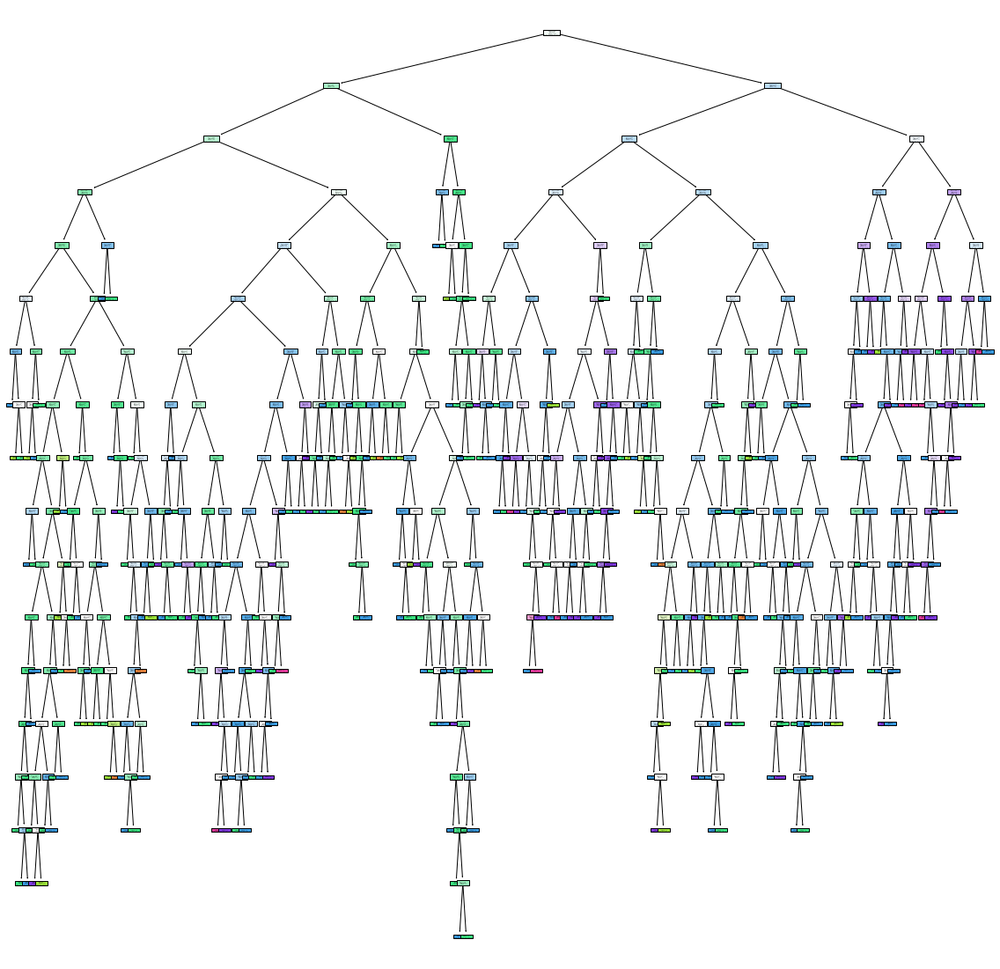

In [26]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model, filled = True)

In [27]:
df1 = df.head(30)

In [28]:
x1 = df1.drop(columns='quality')

In [29]:
y1 = df1['quality']

In [30]:
dt_model1 = DecisionTreeClassifier()

In [31]:
dt_model1.fit(x1, y1)

DecisionTreeClassifier()

[Text(418.5, 996.6, 'X[1] <= 0.355\ngini = 0.471\nsamples = 30\nvalue = [1, 21, 5, 3]'),
 Text(186.0, 815.4000000000001, 'X[10] <= 10.15\ngini = 0.375\nsamples = 4\nvalue = [0, 0, 3, 1]'),
 Text(93.0, 634.2, 'gini = 0.0\nsamples = 3\nvalue = [0, 0, 3, 0]'),
 Text(279.0, 634.2, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 0, 1]'),
 Text(651.0, 815.4000000000001, 'X[6] <= 22.0\ngini = 0.334\nsamples = 26\nvalue = [1, 21, 2, 2]'),
 Text(465.0, 634.2, 'X[5] <= 8.5\ngini = 0.625\nsamples = 4\nvalue = [0, 1, 1, 2]'),
 Text(372.0, 453.0, 'X[10] <= 9.65\ngini = 0.5\nsamples = 2\nvalue = [0, 1, 1, 0]'),
 Text(279.0, 271.79999999999995, 'gini = 0.0\nsamples = 1\nvalue = [0, 1, 0, 0]'),
 Text(465.0, 271.79999999999995, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 1, 0]'),
 Text(558.0, 453.0, 'gini = 0.0\nsamples = 2\nvalue = [0, 0, 0, 2]'),
 Text(837.0, 634.2, 'X[5] <= 7.5\ngini = 0.169\nsamples = 22\nvalue = [1, 20, 1, 0]'),
 Text(744.0, 453.0, 'gini = 0.0\nsamples = 1\nvalue = [1, 0, 0, 0]'),
 Text(930

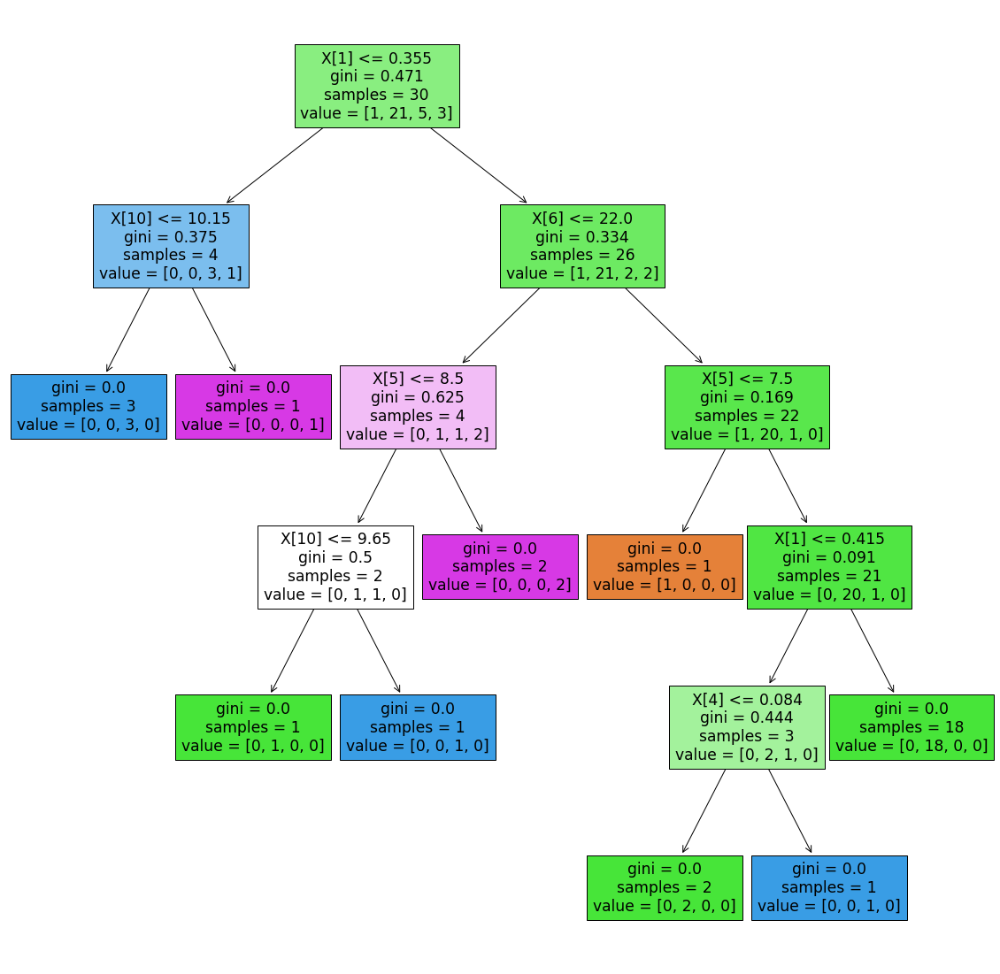

In [32]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model1, filled = True)

In [33]:
set(y1)

{4, 5, 6, 7}

[Text(418.5, 996.6, 'X[1] <= 0.355\ngini = 0.471\nsamples = 30\nvalue = [1, 21, 5, 3]\nclass = 5'),
 Text(186.0, 815.4000000000001, 'X[10] <= 10.15\ngini = 0.375\nsamples = 4\nvalue = [0, 0, 3, 1]\nclass = 6'),
 Text(93.0, 634.2, 'gini = 0.0\nsamples = 3\nvalue = [0, 0, 3, 0]\nclass = 6'),
 Text(279.0, 634.2, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 0, 1]\nclass = 7'),
 Text(651.0, 815.4000000000001, 'X[6] <= 22.0\ngini = 0.334\nsamples = 26\nvalue = [1, 21, 2, 2]\nclass = 5'),
 Text(465.0, 634.2, 'X[5] <= 8.5\ngini = 0.625\nsamples = 4\nvalue = [0, 1, 1, 2]\nclass = 7'),
 Text(372.0, 453.0, 'X[10] <= 9.65\ngini = 0.5\nsamples = 2\nvalue = [0, 1, 1, 0]\nclass = 5'),
 Text(279.0, 271.79999999999995, 'gini = 0.0\nsamples = 1\nvalue = [0, 1, 0, 0]\nclass = 5'),
 Text(465.0, 271.79999999999995, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 1, 0]\nclass = 6'),
 Text(558.0, 453.0, 'gini = 0.0\nsamples = 2\nvalue = [0, 0, 0, 2]\nclass = 7'),
 Text(837.0, 634.2, 'X[5] <= 7.5\ngini = 0.169\nsamples 

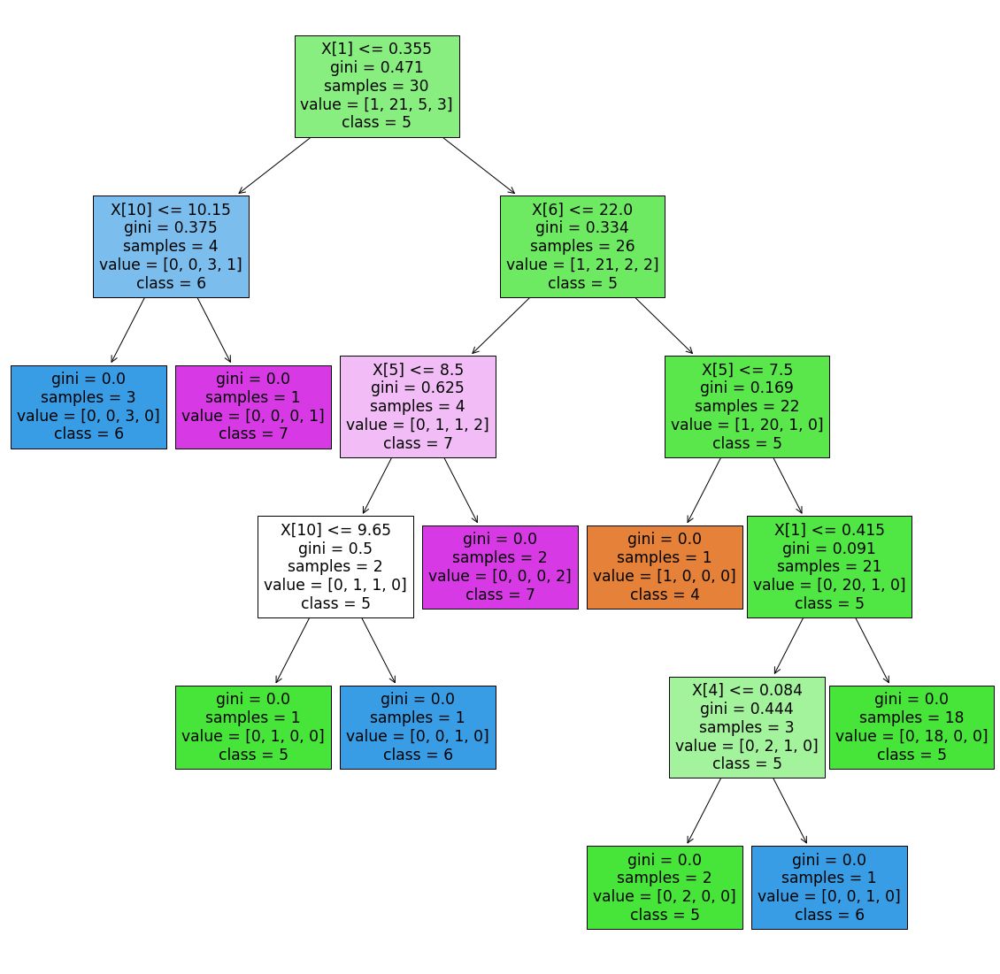

In [34]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model1, filled = True, class_names=[str(i) for i in set(y1)])

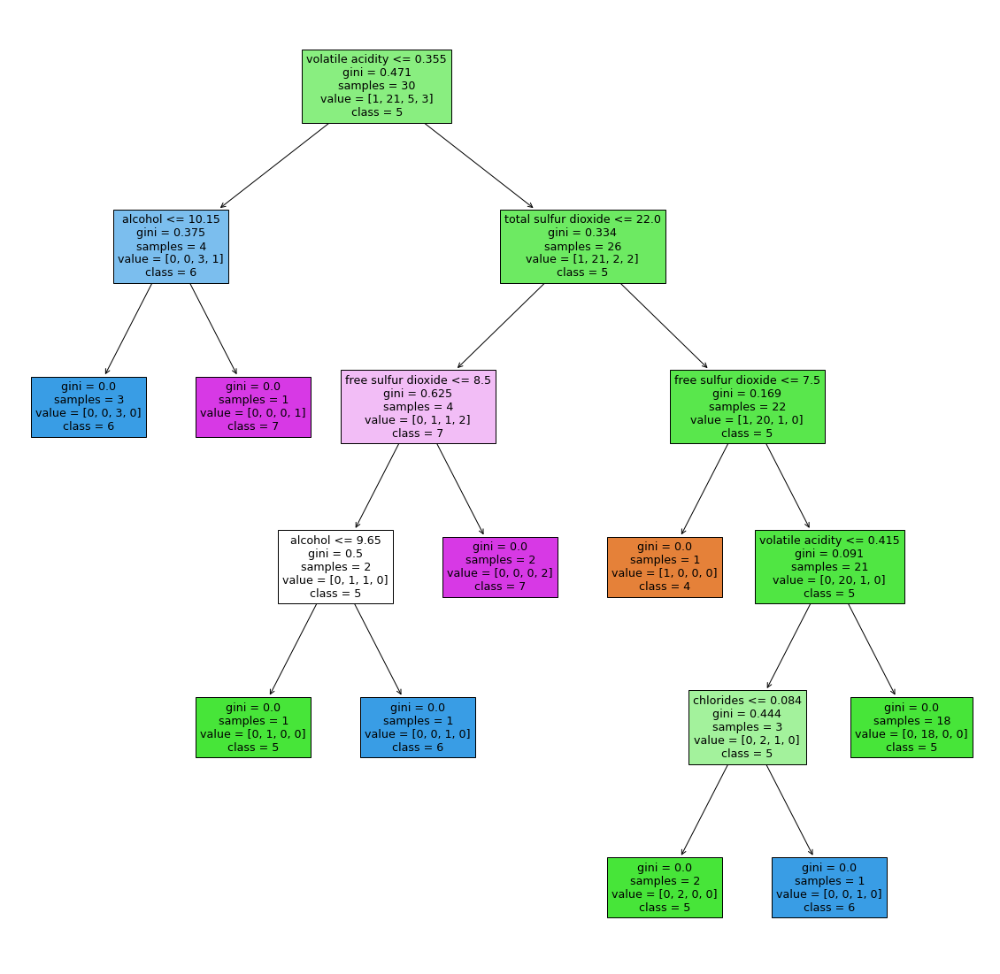

In [36]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model1, filled = True, class_names=[str(i) for i in set(y1)], feature_names=x1.columns)
plt.savefig('dt_model1')

In [37]:
## Post pruning

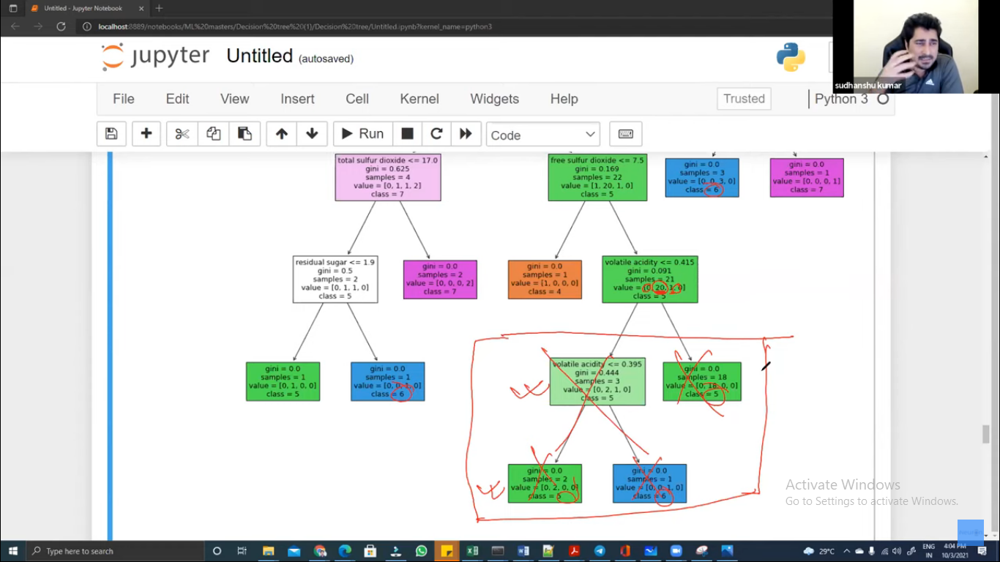

In [38]:
dt_model1.predict(x1)

array([5, 5, 5, 6, 5, 5, 5, 7, 7, 5, 5, 5, 5, 5, 5, 5, 7, 5, 4, 6, 6, 5,
       5, 5, 6, 5, 5, 5, 5, 6], dtype=int64)

In [39]:
dt_model1.score(x1, y1)

1.0

In [40]:
dt_model1.score(x_test, y_test)

0.4975

In [42]:
dt_model.score(x_test, y_test)

0.6075

In [43]:
## Post pruning

In [44]:
path = dt_model1.cost_complexity_pruning_path(x1, y1)

In [45]:
path

{'ccp_alphas': array([0.        , 0.03174603, 0.03333333, 0.05      , 0.05      ,
        0.06075036, 0.08216783, 0.13136752]),
 'impurities': array([0.        , 0.06349206, 0.0968254 , 0.1468254 , 0.1968254 ,
        0.25757576, 0.33974359, 0.47111111])}

In [50]:
ccp_alpha = path['ccp_alphas']

In [51]:
ccp_alpha

array([0.        , 0.03174603, 0.03333333, 0.05      , 0.05      ,
       0.06075036, 0.08216783, 0.13136752])

In [52]:
dt_model2 = []

for ccpa in ccp_alpha:
    dt_m = DecisionTreeClassifier(ccp_alpha=ccpa)
    dt_m.fit(x1, y1)
    
    dt_model2.append(dt_m)

In [53]:
dt_model2

[DecisionTreeClassifier(),
 DecisionTreeClassifier(ccp_alpha=0.03174603174603176),
 DecisionTreeClassifier(ccp_alpha=0.03333333333333333),
 DecisionTreeClassifier(ccp_alpha=0.049999999999999996),
 DecisionTreeClassifier(ccp_alpha=0.05),
 DecisionTreeClassifier(ccp_alpha=0.06075036075036072),
 DecisionTreeClassifier(ccp_alpha=0.08216783216783222),
 DecisionTreeClassifier(ccp_alpha=0.1313675213675214)]

In [54]:
for model in dt_model2:
    print(model.score(x_test, y_test))

0.4625
0.4675
0.4625
0.4075
0.445
0.44
0.4625
0.4225


In [58]:
train_scores = [i.score(x1, y1) for i in dt_model2]
train_scores

[1.0,
 0.9666666666666667,
 0.9333333333333333,
 0.9,
 0.8666666666666667,
 0.8333333333333334,
 0.8,
 0.7]

In [59]:
test_scores = [i.score(x_test, y_test) for i in dt_model2]
test_scores

[0.4625, 0.4675, 0.4625, 0.4075, 0.445, 0.44, 0.4625, 0.4225]

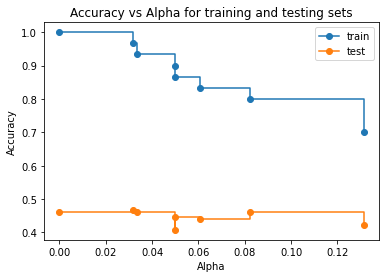

In [65]:
fig, ax = plt.subplots()
ax.set_xlabel('Alpha')
ax.set_ylabel('Accuracy')
ax.set_title('Accuracy vs Alpha for training and testing sets')

ax.plot(ccp_alpha, train_scores, marker = 'o', label = 'train', drawstyle = 'steps-post')
ax.plot(ccp_alpha, test_scores, marker = 'o', label = 'test', drawstyle = 'steps-post')

ax.legend()
plt.show()

In [66]:
dt_model_ccp = DecisionTreeClassifier(random_state=0, ccp_alpha=0.014)
dt_model_ccp.fit(x1, y1)

DecisionTreeClassifier(ccp_alpha=0.014, random_state=0)

[Text(697.5, 996.6, 'X[2] <= 0.42\ngini = 0.471\nsamples = 30\nvalue = [1, 21, 5, 3]'),
 Text(465.0, 815.4000000000001, 'X[6] <= 22.0\ngini = 0.334\nsamples = 26\nvalue = [1, 21, 2, 2]'),
 Text(279.0, 634.2, 'X[5] <= 8.5\ngini = 0.625\nsamples = 4\nvalue = [0, 1, 1, 2]'),
 Text(186.0, 453.0, 'X[7] <= 0.996\ngini = 0.5\nsamples = 2\nvalue = [0, 1, 1, 0]'),
 Text(93.0, 271.79999999999995, 'gini = 0.0\nsamples = 1\nvalue = [0, 1, 0, 0]'),
 Text(279.0, 271.79999999999995, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 1, 0]'),
 Text(372.0, 453.0, 'gini = 0.0\nsamples = 2\nvalue = [0, 0, 0, 2]'),
 Text(651.0, 634.2, 'X[5] <= 7.5\ngini = 0.169\nsamples = 22\nvalue = [1, 20, 1, 0]'),
 Text(558.0, 453.0, 'gini = 0.0\nsamples = 1\nvalue = [1, 0, 0, 0]'),
 Text(744.0, 453.0, 'X[1] <= 0.415\ngini = 0.091\nsamples = 21\nvalue = [0, 20, 1, 0]'),
 Text(651.0, 271.79999999999995, 'X[4] <= 0.084\ngini = 0.444\nsamples = 3\nvalue = [0, 2, 1, 0]'),
 Text(558.0, 90.59999999999991, 'gini = 0.0\nsamples = 2\nval

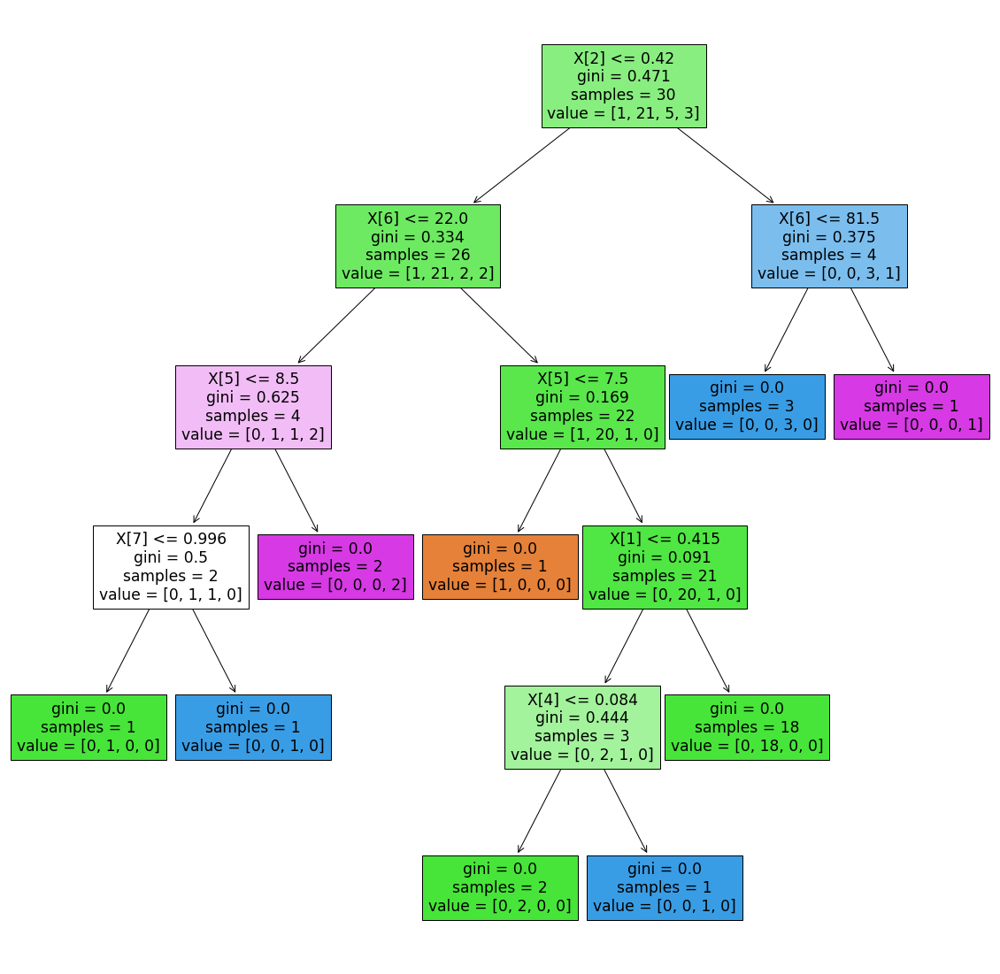

In [67]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model_ccp, filled=True)

In [68]:
dt_model_ccp.score(x1, y1)

1.0

In [69]:
dt_model_ccp.score(x_test, y_test)

0.47

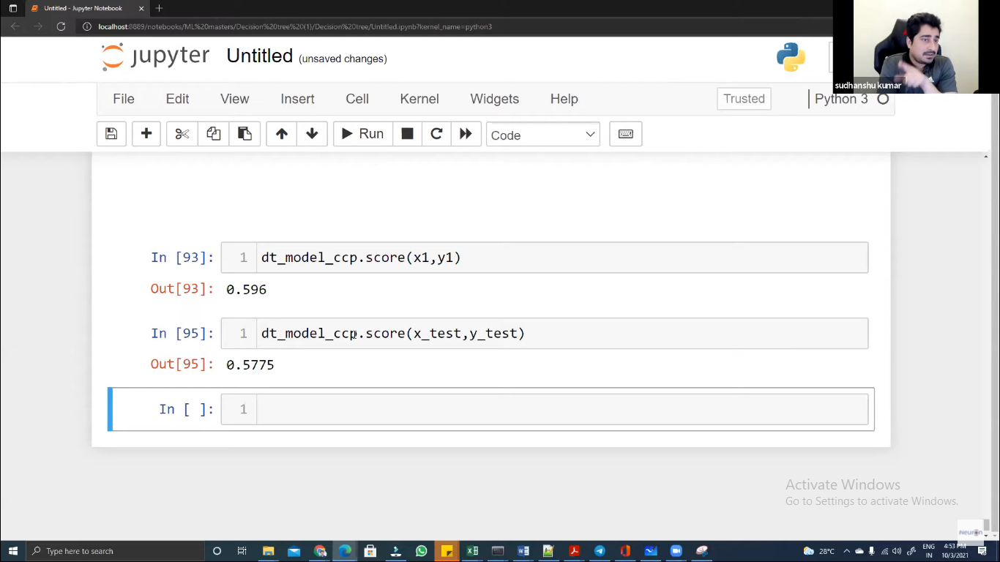

In [ ]:
DecisionTreeClassifier()

In [70]:
grid_pram = {
    
    'criterion' : ['gini', 'entropy'],
    'splitter' : ['best', 'random'],
    'max_depth' : range(2,40,1),
    'min_samples_split' : range(2, 10, 1),
    'min_samples_leaf' : range(2, 10, 1)
}

In [71]:
grid_ccp = GridSearchCV(estimator = dt_model_ccp, param_grid = grid_pram, cv = 5, n_jobs = -1)

In [72]:
grid_ccp

GridSearchCV(cv=5,
             estimator=DecisionTreeClassifier(ccp_alpha=0.014, random_state=0),
             n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': range(2, 40),
                         'min_samples_leaf': range(2, 10),
                         'min_samples_split': range(2, 10),
                         'splitter': ['best', 'random']})

In [73]:
grid_ccp.fit(x1, y1)

C:\Users\Chandan Kumar\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:666: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"


GridSearchCV(cv=5,
             estimator=DecisionTreeClassifier(ccp_alpha=0.014, random_state=0),
             n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': range(2, 40),
                         'min_samples_leaf': range(2, 10),
                         'min_samples_split': range(2, 10),
                         'splitter': ['best', 'random']})

In [74]:
grid_ccp.best_params_

{'criterion': 'gini',
 'max_depth': 2,
 'min_samples_leaf': 2,
 'min_samples_split': 2,
 'splitter': 'random'}

In [80]:
dt_ccp_new = DecisionTreeClassifier(criterion='gini', max_depth=2, min_samples_leaf=2, min_impurity_split=2, splitter='random')

In [81]:
dt_ccp_new.fit(x1, y1)

C:\Users\Chandan Kumar\anaconda3\lib\site-packages\sklearn\tree\_classes.py:316: FutureWarning: The min_impurity_split parameter is deprecated. Its default value has changed from 1e-7 to 0 in version 0.23, and it will be removed in 1.0 (renaming of 0.25). Use the min_impurity_decrease parameter instead.
  warnings.warn(


DecisionTreeClassifier(max_depth=2, min_impurity_split=2, min_samples_leaf=2,
                       splitter='random')

In [82]:
dt_ccp_new.score(x1, y1)

0.7

In [83]:
dt_ccp_new.score(x_test, y_test)

0.4225

In [84]:
pred = dt_ccp_new.predict(x_train)

In [85]:
pred

array([5, 5, 5, ..., 5, 5, 5], dtype=int64)

In [86]:
confusion_matrix(y_train, pred)

array([[  0,   0,   8,   0,   0,   0],
       [  0,   0,  35,   0,   0,   0],
       [  0,   0, 512,   0,   0,   0],
       [  0,   0, 477,   0,   0,   0],
       [  0,   0, 153,   0,   0,   0],
       [  0,   0,  14,   0,   0,   0]], dtype=int64)